In [1]:
# importing Required Modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split

In [2]:
# code to generate frames from input video
video=cv2.VideoCapture('ibr.mp4')
ct=0
success=True
images=[]
while(success):
    success,image=video.read()
    # cv2.imwrite(f"frame{ct}.jpg", image)
    if(success and ct%2==0):
        images.append(cv2.resize(image,(160,120)))
        # print(ct)
    ct+=1
images=np.array(images)

In [3]:
# function to compute svd by taking input matrix X and num_components as input
def compute_svd(X, num_components):
    # Step 1: Compute X^T X
    XTX = np.dot(X.T, X)

    # Step 2: Eigenvalue decomposition of X^T X using power iteration
    n = XTX.shape[0]
    eigenvalues = []
    eigenvectors = np.zeros((n, num_components))

    for i in range(num_components):
        # Random initial vector
        v = np.random.rand(n)
        v /= np.linalg.norm(v)

        # Power iteration to find the largest eigenvalue and eigenvector
        for _ in range(100):  # Max iterations
            v_new = np.dot(XTX, v)
            v_new /= np.linalg.norm(v_new)
            if np.allclose(v, v_new):
                break
            v = v_new

        # Store the eigenvector and deflate XTX
        eigenvectors[:, i] = v
        eigenvalue = np.dot(v.T, np.dot(XTX, v))
        eigenvalues.append(eigenvalue)
        XTX -= eigenvalue * np.outer(v, v)

    # Compute singular values
    singular_values = np.sqrt(eigenvalues)

    # Compute left singular vectors (U)
    U = np.dot(X, eigenvectors) / singular_values

    return U, singular_values, eigenvectors.T

In [4]:
# function to perform svd on frames extracted from the video
def perform_pod_svd(frames, num_components=10):
    # Flatten the images and build the data matrix
    reshaped_frames = [frame.flatten() for frame in frames]
    X = np.column_stack(reshaped_frames)

    # Subtract the mean image
    mean_image = np.mean(X, axis=1)
    X_prime = X - mean_image[:, np.newaxis]

    # Custom SVD Implementation
    U, S, VT = compute_svd(X_prime, num_components)

    return U, S, mean_image

In [5]:
# function to plot top modes obtained after using SVD
def plot_modes(U, mean_image, image_shape, num_modes=10):
    plt.figure(figsize=(15, 10))
    for i in range(num_modes):
        plt.subplot(2, 5, i + 1)
        mode_image = U[:, i].reshape(image_shape)*255
        mode_image = mode_image.astype(np.uint8)
        plt.imshow(cv2.cvtColor(mode_image, cv2.COLOR_BGR2RGB))
        plt.title(f'Mode {i+1}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [6]:
# function to plot energy distribution graph in different modes
def plot_singular_values(singular_values):
    # Calculate the energy of each mode
    energy = singular_values**2
    total_energy = np.sum(energy)
    energy_percentage = (energy / total_energy) * 100

    # Plot the energy distribution
    color = (0.2,  0.4, 0.2, 0.6 )
    plt.figure(figsize=(10, 5))
    plt.bar(range(1, len(energy) + 1), energy_percentage,color=color)
    plt.xlabel('Mode Number')
    plt.ylabel('Energy Percentage (%)')
    plt.title('Energy Distribution among POD Modes')
    plt.xticks(range(1, len(energy) + 1))
    plt.show()

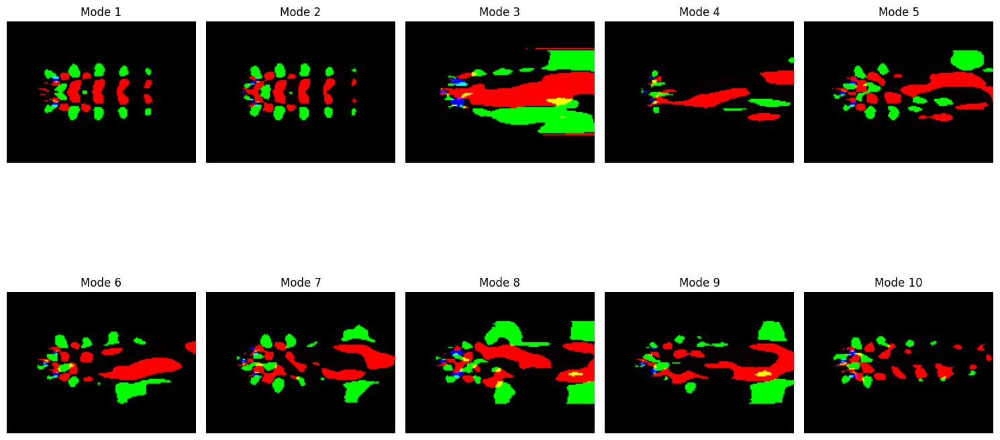

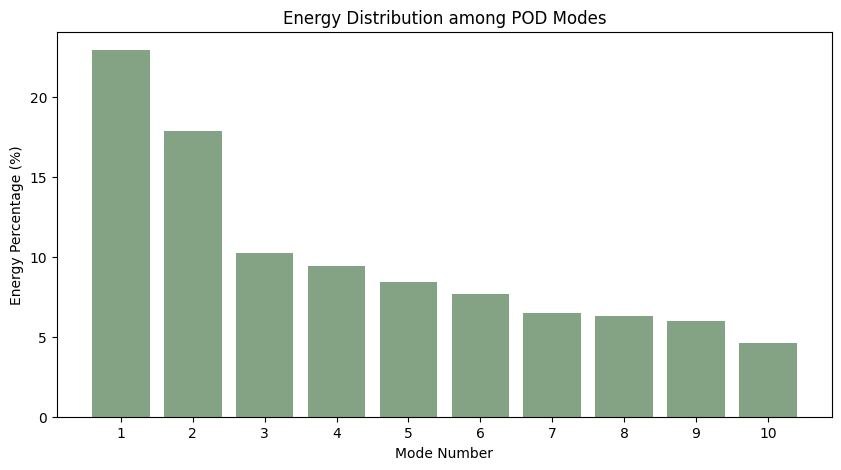

In [7]:
#applyiing SVD to frames of video and plotting its top 10 modes as well as energy distribution graph
U, S, mean_image = perform_pod_svd(images, num_components=10)
plot_modes(U, mean_image, image_shape=images[0].shape)
plot_singular_values(S)

In [8]:
#functions to add different types of noise to the frames
def add_gaussian_noise(image, noise_level):
    mean = 0
    std_dev = noise_level * np.max(image) / 100
    gaussian_noise = np.random.normal(mean, std_dev, image.shape)
    noisy_image = image + gaussian_noise
    return np.clip(noisy_image, 0, 255)

def add_salt_and_pepper_noise(image, noise_level):
    s_vs_p = 0.5
    amount = noise_level / 100
    noisy_image = np.copy(image)
    # Salt (white noise)
    num_salt = np.ceil(amount * image.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy_image[tuple(coords)] = 255

    # Pepper (black noise)
    num_pepper = np.ceil(amount * image.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy_image[tuple(coords)] = 0

    return noisy_image

def add_speckle_noise(image, noise_level):
    speckle = np.random.randn(*image.shape)
    noisy_image = image + image * speckle * noise_level / 100
    return np.clip(noisy_image, 0, 255)

In [9]:
# function to apply a type of noise to the frames for different noise_levels
def apply_noise_to_frames(frames, noise_type='gaussian', noise_levels=[20, 40, 60, 80]):
    noisy_frames_sets = []
    for level in noise_levels:
        if noise_type == 'gaussian':
            noisy_frames = [add_gaussian_noise(frame, level) for frame in frames]
        elif noise_type == 'salt_and_pepper':
            noisy_frames = [add_salt_and_pepper_noise(frame, level) for frame in frames]
        elif noise_type == 'speckle':
            noisy_frames = [add_speckle_noise(frame, level) for frame in frames]
        noisy_frames_sets.append(noisy_frames)
    return noisy_frames_sets


In [10]:
# Adding 3 types of noise to the frames for different noise levels
frames = images
gaussian_noisy_frames = apply_noise_to_frames(frames, 'gaussian')
sap_noisy_frames = apply_noise_to_frames(frames, 'salt_and_pepper')
speckle_noisy_frames = apply_noise_to_frames(frames, 'speckle')

20


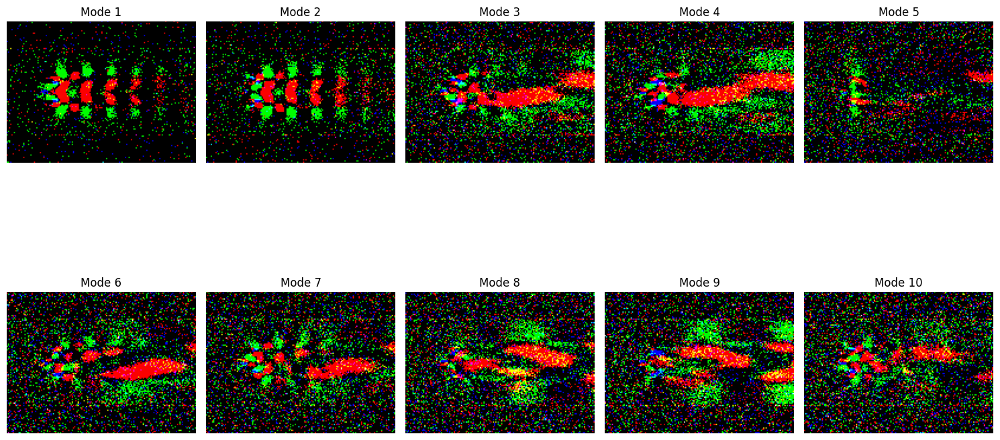

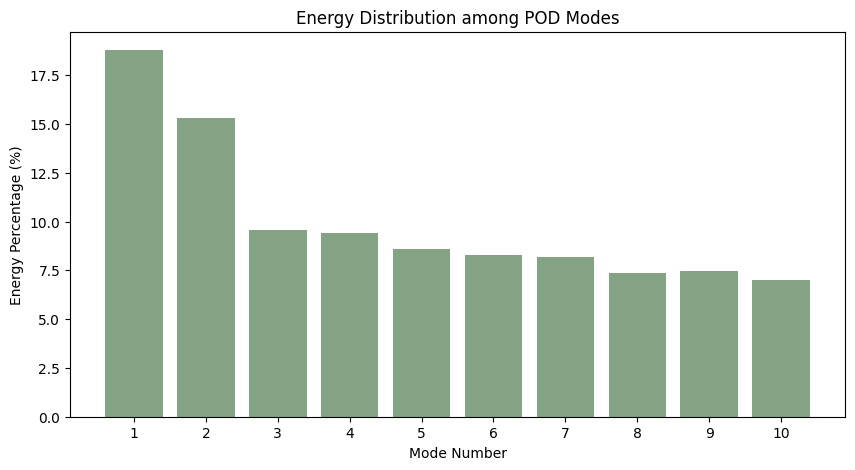

40


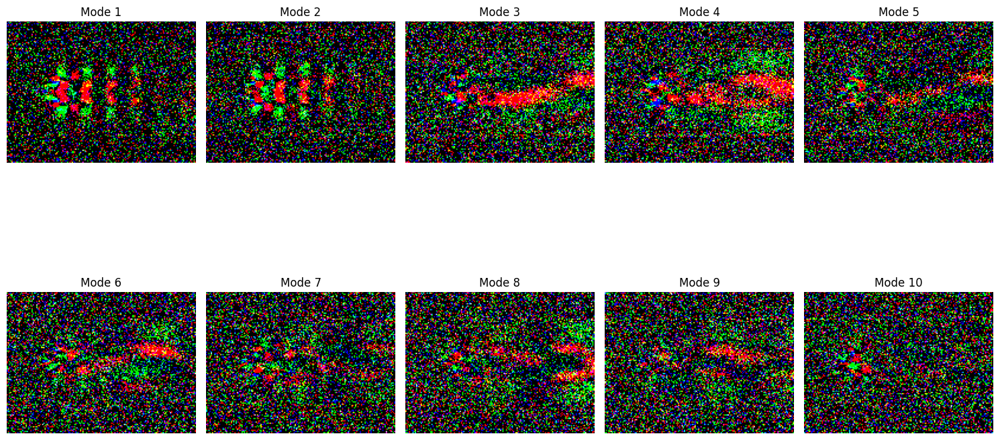

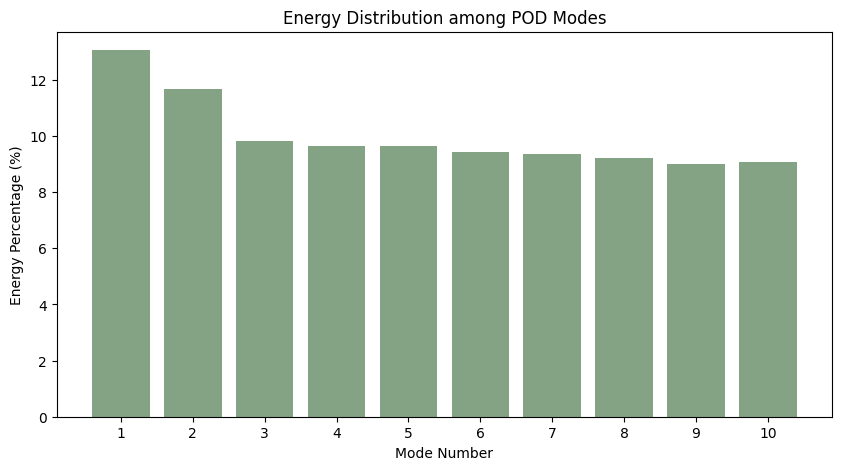

60


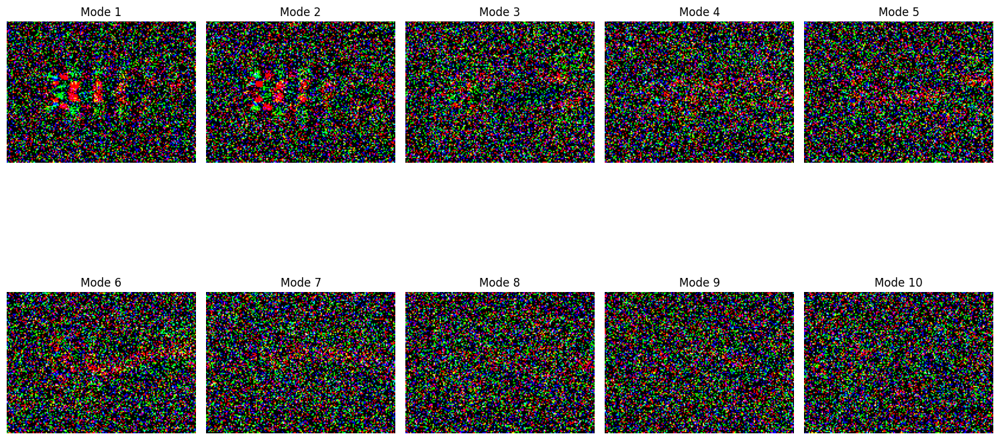

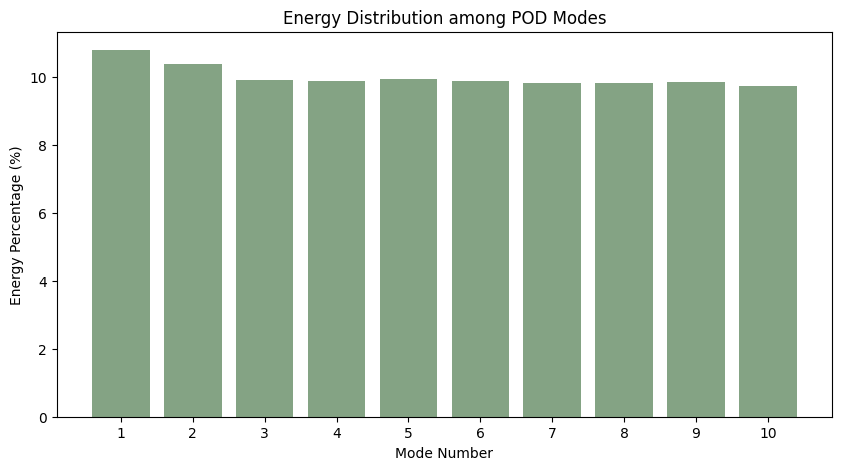

80


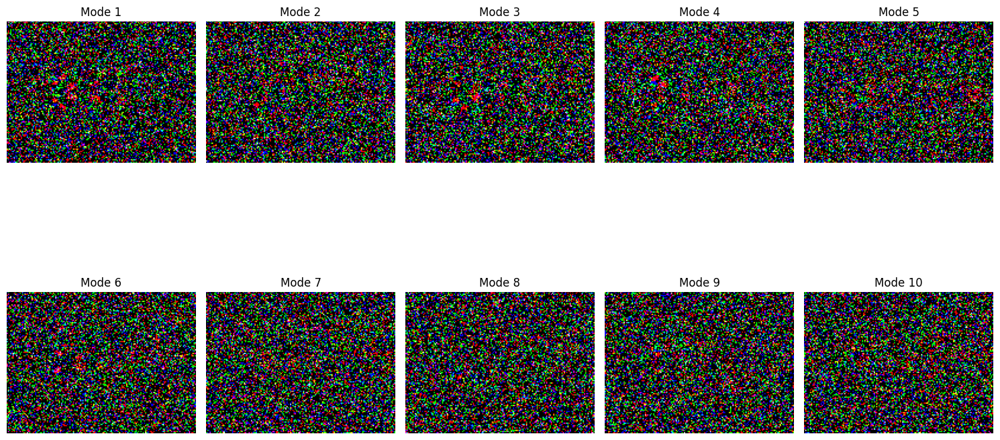

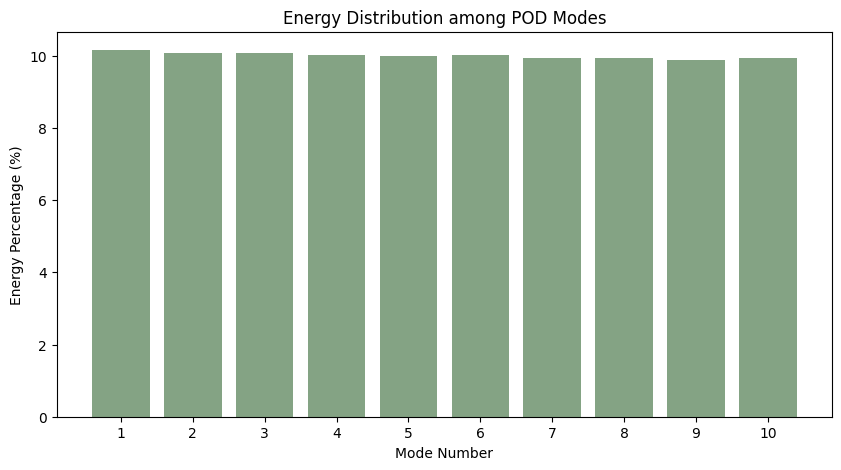

In [11]:
# applying and plotting energy modes and distributions for frames with gaussian noise
noise_levels=[20, 40, 60, 80]
for i in range(4):
    print(noise_levels[i])
    U, S, mean_image = perform_pod_svd(gaussian_noisy_frames[i], num_components=10)
    plot_modes(U, mean_image, image_shape=images[0].shape)
    plot_singular_values(S)

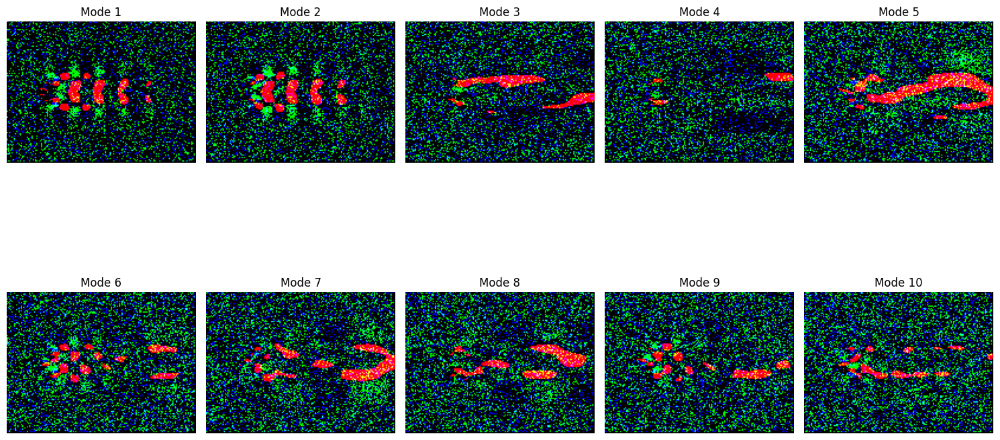

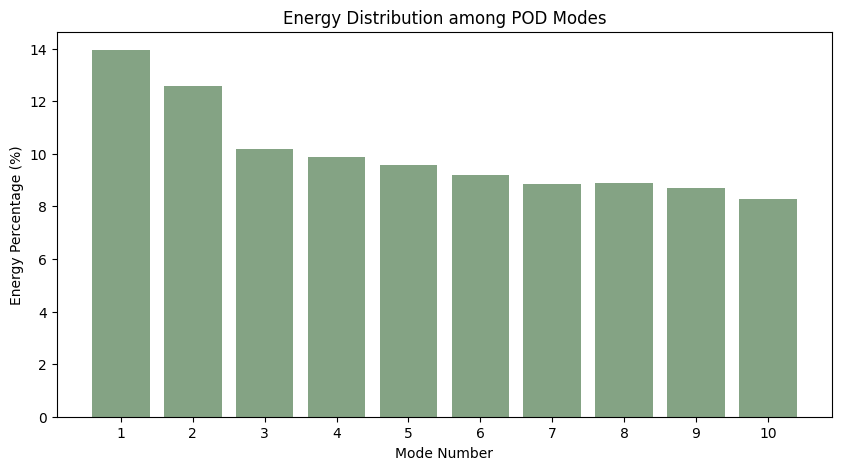

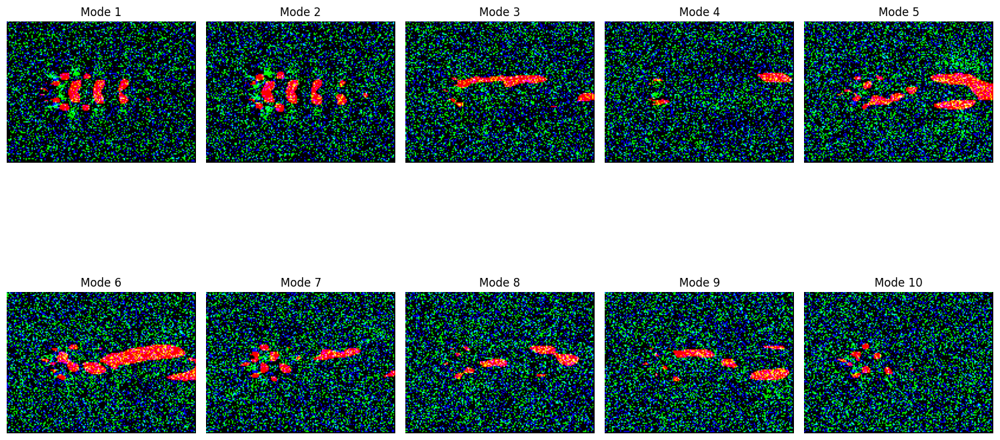

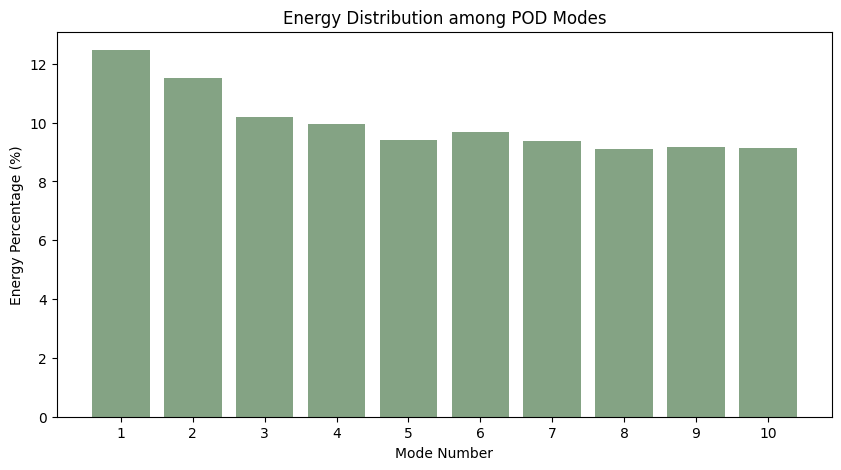

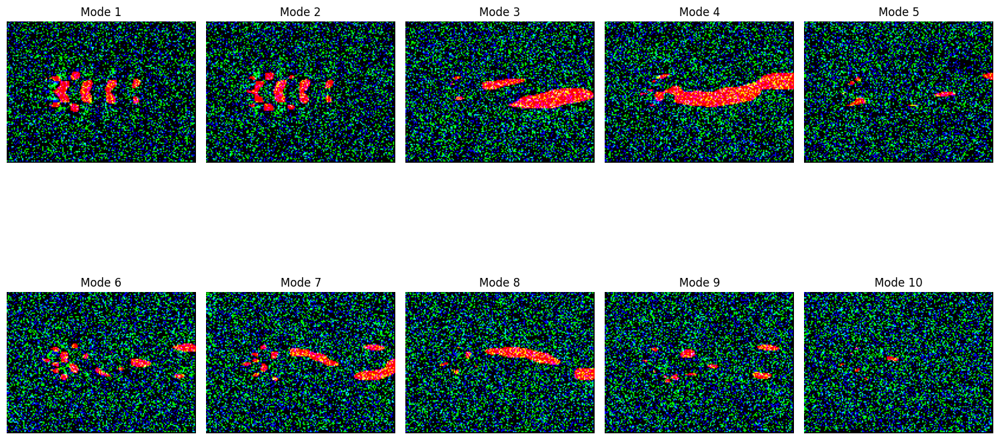

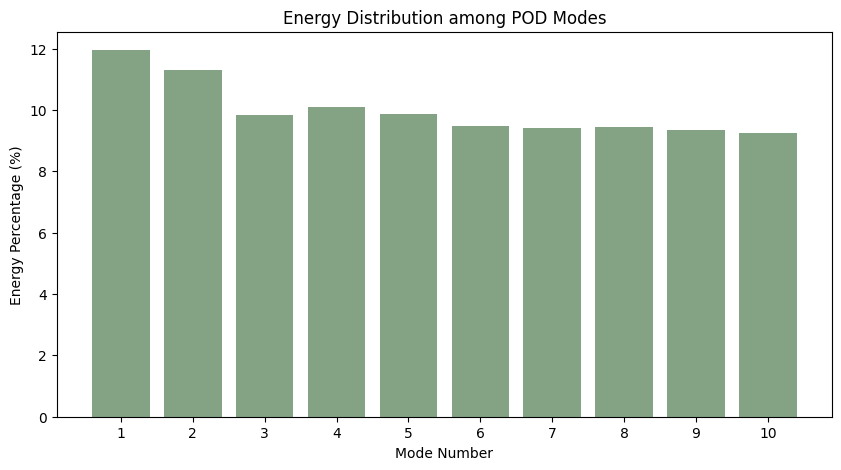

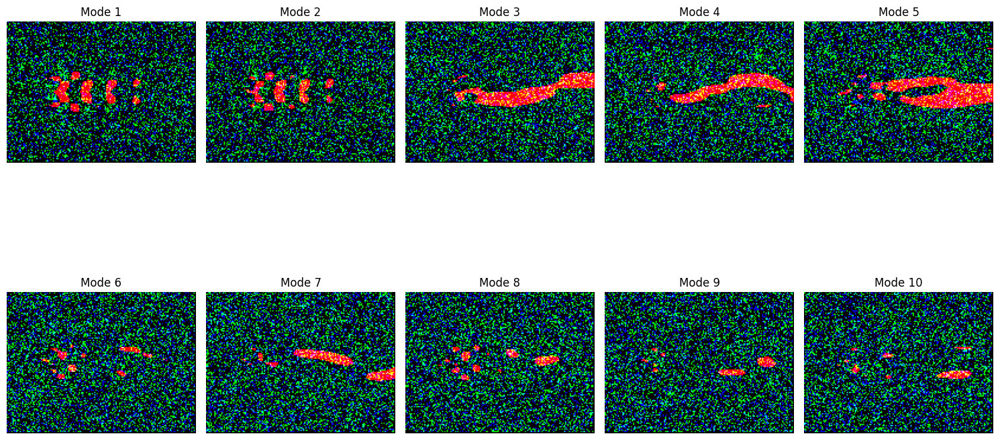

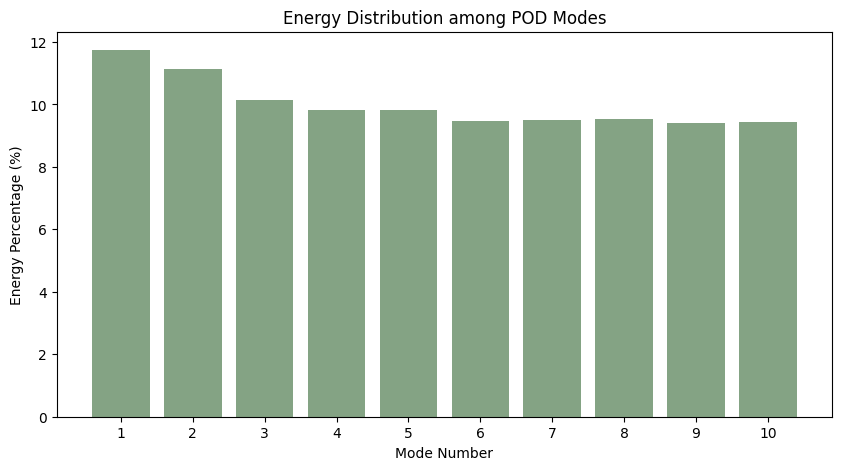

In [12]:
# applying and plotting energy modes and distributions for frames with gaussian noise
noise_levels=[20, 40, 60, 80]
for i in range(4):
    U, S, mean_image = perform_pod_svd(sap_noisy_frames[i], num_components=10)
    plot_modes(U, mean_image, image_shape=images[0].shape)
    plot_singular_values(S)

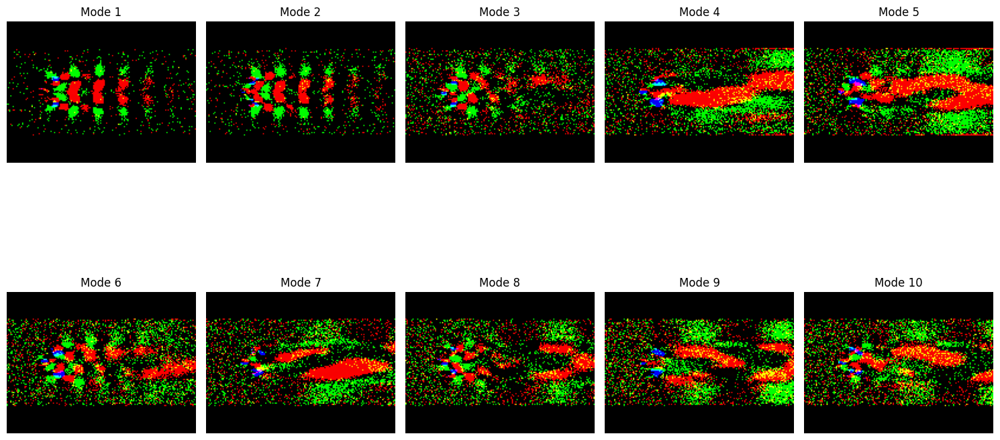

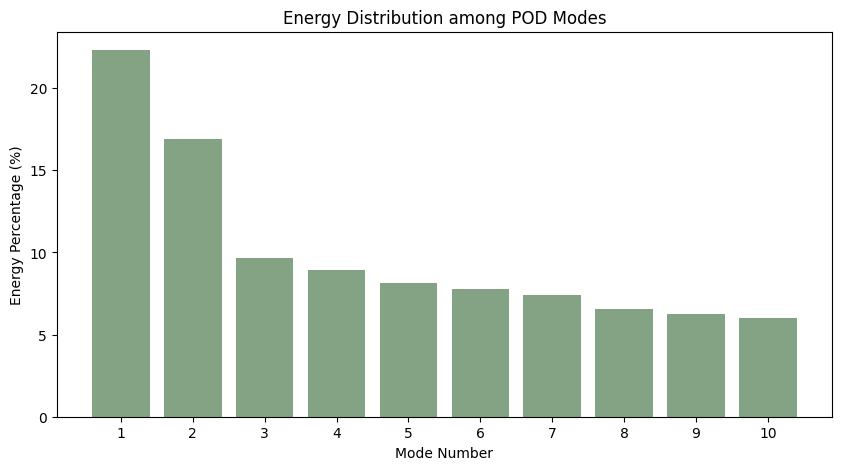

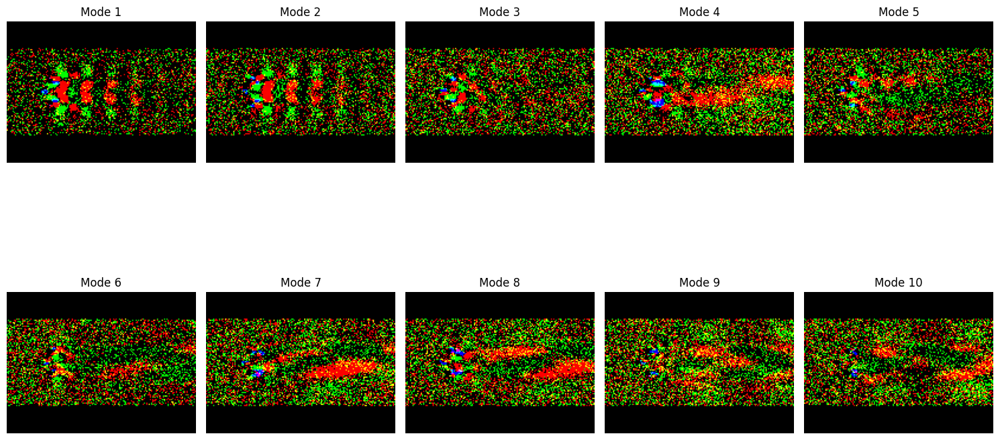

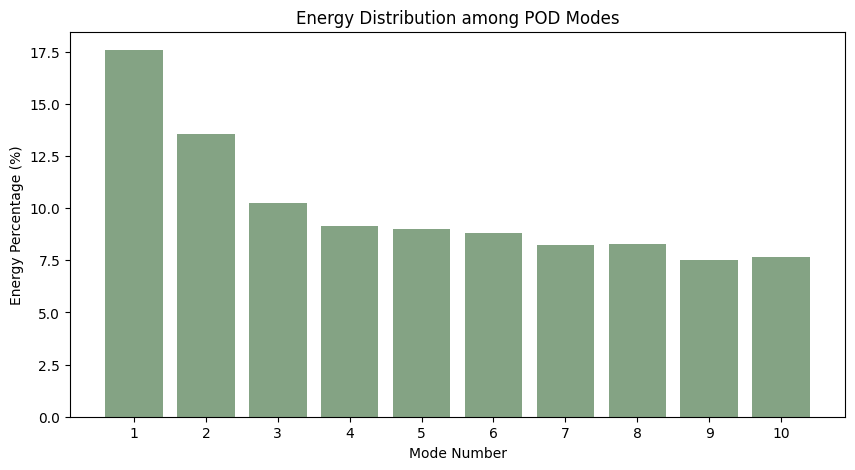

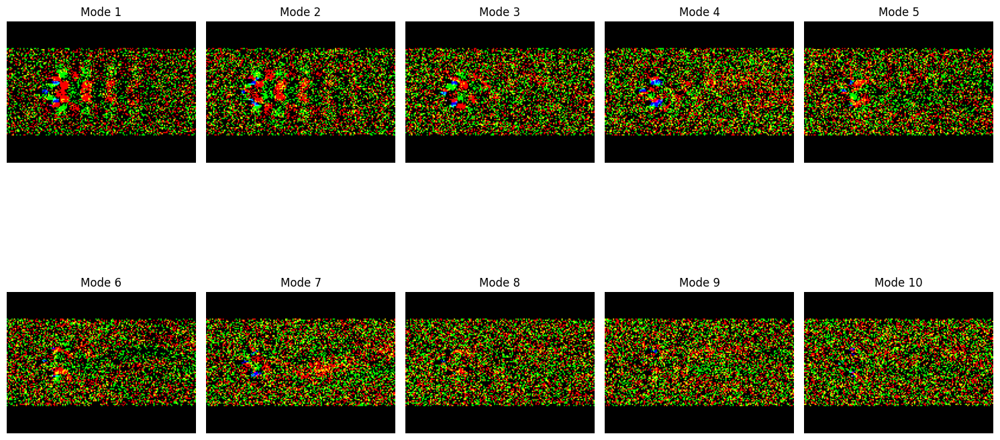

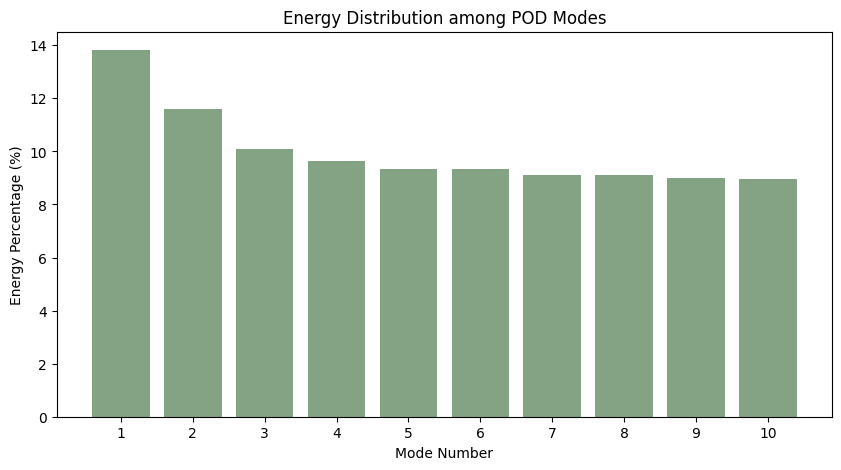

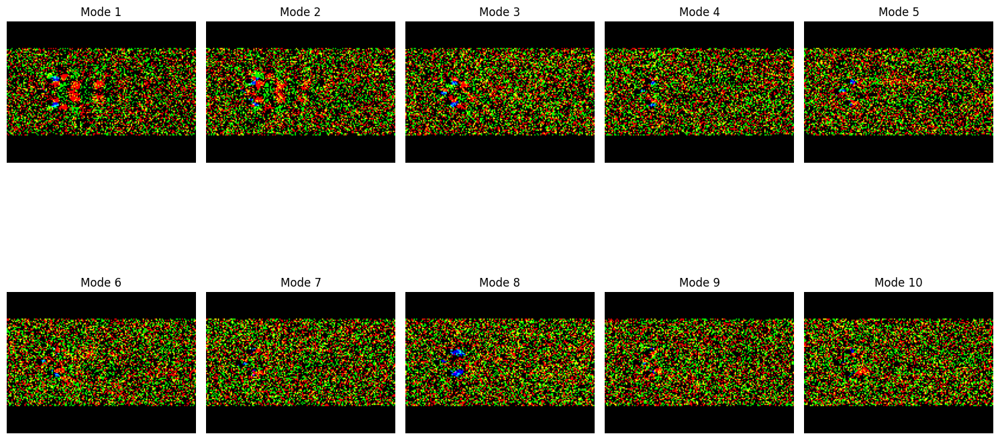

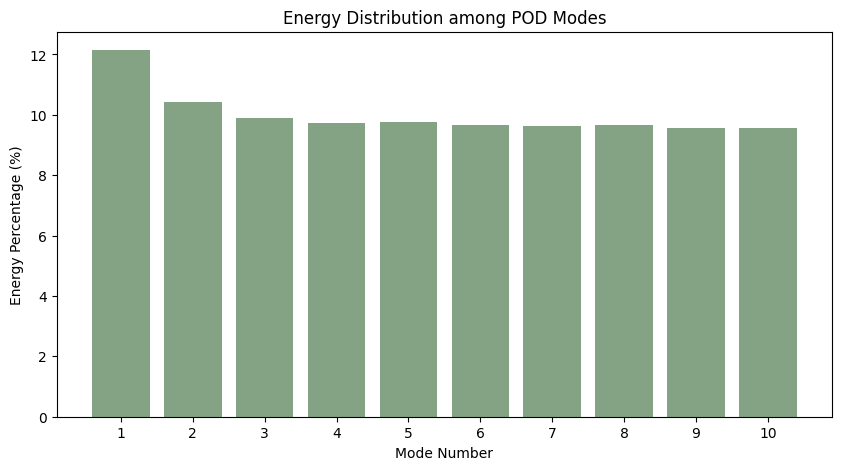

In [13]:
# applying and plotting energy modes and distributions for frames with gaussian noise
noise_levels=[20, 40, 60, 80]
for i in range(4):
    U, S, mean_image = perform_pod_svd(speckle_noisy_frames[i], num_components=10)
    plot_modes(U, mean_image, image_shape=images[0].shape)
    plot_singular_values(S)

In [14]:
# creating a Function that return a denoising CNN model
def build_denoising_model():
    input_img = Input(shape=images[0].shape)  # adapt this if using RGB images
    x = Conv2D(32, (3, 3), padding='same')(input_img)
    x = Activation('relu')(x)
    x = Conv2D(32, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(1, (3, 3), padding='same')(x)
    output_img = Activation('sigmoid')(x)
    model = Model(inputs=input_img, outputs=output_img)
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

#Building the model
model = build_denoising_model()

# making train and test set for clean and noisy images
X_train_clean, X_test, y_train, y_test = train_test_split( images, np.zeros(images.shape), test_size=0.2, random_state=42)
X_train_noisy=add_gaussian_noise(X_train_clean,20)
noisy_images=add_gaussian_noise(X_test,20)

model.fit(X_train_noisy, X_train_clean, epochs=50, batch_size=128)

# getting Denoised images on testing noisy images
denoised_images = model.predict(noisy_images)


Epoch 1/50
3/3 [==============================] - 6s 2s/step - loss: 22379.7656
Epoch 2/50
3/3 [==============================] - 4s 1s/step - loss: 22324.8438
Epoch 3/50
3/3 [==============================] - 4s 1s/step - loss: 22293.9414
Epoch 4/50
3/3 [==============================] - 4s 1s/step - loss: 22280.7344
Epoch 5/50
3/3 [==============================] - 4s 1s/step - loss: 22273.7520
Epoch 6/50
3/3 [==============================] - 5s 1s/step - loss: 22269.5605
Epoch 7/50
3/3 [==============================] - 5s 1s/step - loss: 22266.7227
Epoch 8/50
3/3 [==============================] - 5s 2s/step - loss: 22264.6016
Epoch 9/50
3/3 [==============================] - 4s 1s/step - loss: 22263.2383
Epoch 10/50
3/3 [==============================] - 4s 1s/step - loss: 22262.2773
Epoch 11/50
3/3 [==============================] - 4s 1s/step - loss: 22261.4980
Epoch 12/50
3/3 [==============================] - 4s 1s/step - loss: 22260.8887
Epoch 13/50
3/3 [====================

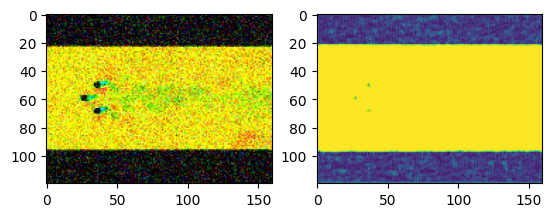

In [33]:
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(noisy_images[0].astype(np.uint8),cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.imshow(denoised_images[0])

In [19]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import numpy as np

# Calculating peak_signal_noise_ratio and structural_similarity scores for the trained model
image_quality_scores = [(psnr(true_image, denoised_image, data_range=true_image.max() - true_image.min()),
                         ssim(true_image, denoised_image, data_range=true_image.max() - true_image.min(), channel_axis=-1))
                        for true_image, denoised_image in zip(np.mean(X_test, axis=3), np.mean(denoised_images, axis=3))]

average_psnr, average_ssim = np.mean(image_quality_scores, axis=0)
print("Average PSNR:", average_psnr)
print("Average SSIM:", average_ssim)


Average PSNR: 2.7087817892829222
Average SSIM: 0.29421849591340776
